# MCMC Comparison

## surmise

1. Train a GP (using surmise) to emulate the ${}^3{\rm He}(\alpha,\gamma)$ observables. 
2. Use that GP to calculate the $R$-matrix parameter posteriors.
3. Compare to the results in our BRICK paper.

* CP model
* 1000 training points

In [1]:
import os
import subprocess
from smt.sampling_methods import LHS

import numpy as np
import matplotlib.pyplot as plt
from corner import corner
import seaborn as sns
from scipy import stats
from surmise.emulation import emulator
import emcee
import h5py

import model as model

In [2]:
plt.style.use('science')
gr = (1 + np.sqrt(5)) / 2
h = 3

plt.rcParams['figure.dpi'] = 150

## Train the GP

In [6]:
data = np.load('datfiles/training_data.npy')
points = np.load('datfiles/training_points.npy')
x = model.x.copy()[:, np.newaxis]
y = model.y.copy()[:, np.newaxis]
dy = model.dy.copy()[:, np.newaxis]

In [7]:
ntrain = 200
ntest = 1000 - ntrain

In [9]:
f = data[:ntrain, :]
w = points[:ntrain, :]

In [10]:
x.shape, w.shape, f.shape

((573, 1), (200, 16), (200, 573))

In [11]:
# Set up the surmise emulator.
args = {'epsilon' : 0.1, 'warnings' : True}
# args = {'epsilon': 0.1, ‘hypregmean’: -8}
emu = emulator(x=x, theta=w, f=f, method='PCGPwM', args=args)

/home/odell/anaconda3/lib/python3.7/site-packages/surmise/emulation.py:109: UserWarning: Transposing f to try to get agreement
  warnings.warn('Transposing f to try to get agreement')


PCGPwM considering  57 PCs


In [12]:
def residuals(y, mu, dy):
    return (y - mu) / dy

def relative_uncertainties(p):
    return (np.sqrt(p.var()) / p.mean())[0]

def absolute_uncertainties(p):
    return np.sqrt(p.var())[0]

In [13]:
%%time
ptrain = emu.predict() # Let's check how the training went.

CPU times: user 3.79 s, sys: 657 ms, total: 4.44 s
Wall time: 288 ms


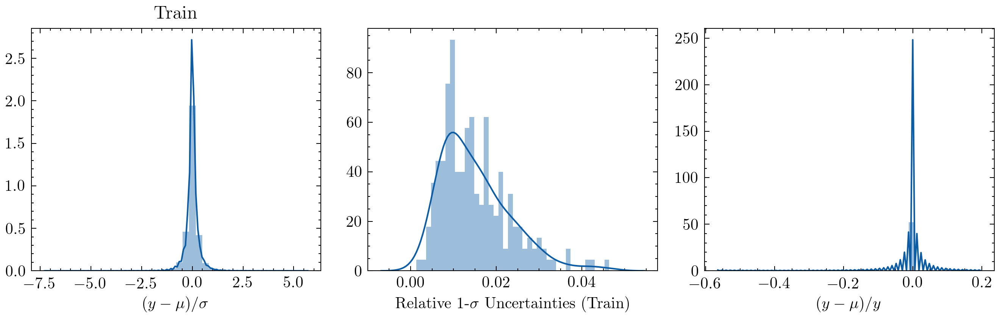

In [15]:
fig, ax = plt.subplots(ncols=3, figsize=(3*h, h), dpi=300)
fig.patch.set_facecolor('white')

sns.distplot(residuals(f.T, ptrain.mean(), np.sqrt(ptrain.var())).flatten(), bins=40, ax=ax[0], kde=True)
ax[0].set_xlabel(r'$(y-\mu)/\sigma$')
ax[0].set_title('Train')

sns.distplot(relative_uncertainties(ptrain).flatten(), bins=40, ax=ax[1], kde=True) 
ax[1].set_xlabel(r'Relative 1-$\sigma$ Uncertainties (Train)')

sns.distplot(((f.T - ptrain.mean()) / f.T).flatten(), bins=40, ax=ax[2], kde=True) 
ax[2].set_xlabel(r'$(y-\mu)/y$')

plt.tight_layout();

In [16]:
fp = data[ntrain:, :]
wp = points[ntrain:, :]

In [17]:
fp.shape, 

((800, 573),)

In [18]:
# Now let's test it.
p = emu.predict(x=x, theta=wp)

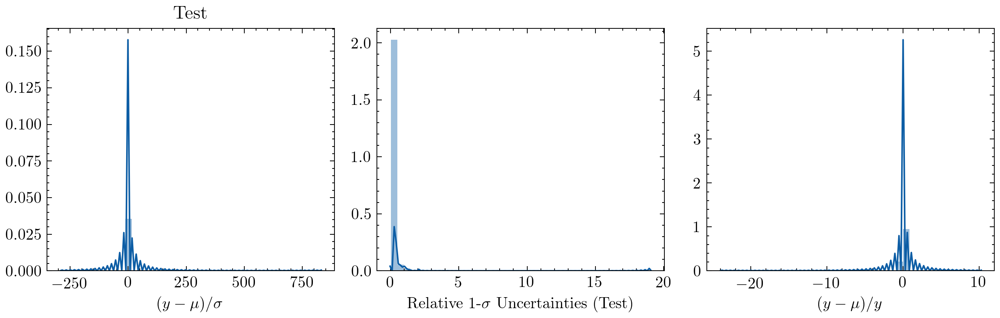

In [20]:
fig, ax = plt.subplots(ncols=3, figsize=(3*h, h), dpi=300)
fig.patch.set_facecolor('white')

sns.distplot(residuals(fp.T, p.mean(), np.sqrt(p.var())).flatten(), bins=40, ax=ax[0], kde=True)
ax[0].set_xlabel(r'$(y-\mu)/\sigma$')
ax[0].set_title('Test')

sns.distplot(relative_uncertainties(p).flatten(), bins=40, ax=ax[1], kde=True) 
ax[1].set_xlabel(r'Relative 1-$\sigma$ Uncertainties (Test)')

sns.distplot(((fp.T - p.mean()) / fp.T).flatten(), bins=40, ax=ax[2], kde=True) 
ax[2].set_xlabel(r'$(y-\mu)/y$')

plt.tight_layout();

In [21]:
bounds = np.array([[np.min(w[:, i]), np.max(w[:, i])] for i in range(w.shape[1])])

In [22]:
%%time
emu.predict(w[0, :, np.newaxis])

CPU times: user 2.72 s, sys: 167 ms, total: 2.88 s
Wall time: 192 ms


A emulation prediction object predict where the code in located in the file  emulation.  The main method are predict.covx, predict.covxhalf, predict.covxhalf_gradtheta, predict.lpdf, predict.lpdf_gradtheta, predict.mean, predict.mean_gradtheta, predict.rnd, predict.var.  Default of predict() is predict.mean() and predict(s) will run pred.rnd(s). Run help(predict) for the document string.

In [24]:
def ln_prior(theta):
    return np.sum([p.logpdf(t) for (p, t) in zip(model.priors, theta)])

In [36]:
nrpar = 16
nf_capture = 6
nf_scatter = 10

num_data_points = y.shape[0]
num_pts_branching_ratio = model.branching_ratio.size

In [37]:
class Model:
    def __init__(self, predict):
        self.predict_func = predict
    
    
    def ln_likelihood(self, theta):
        theta_R = theta[:nrpar]
        theta_f_capture = theta[nrpar:nrpar+nf_capture]
        theta_f_scatter = theta[nrpar+nf_capture:]
        f_capture = model.map_uncertainty(theta_f_capture, model.num_pts_capture)
        f_scatter = model.map_uncertainty(theta_f_scatter, model.num_pts_scatter)
        
        f = np.ones(num_data_points)
        f[num_pts_branching_ratio:num_pts_branching_ratio+model.num_pts_total_capture] = f_capture
        f[num_pts_branching_ratio+model.num_pts_total_capture:] = f_scatter
        
        mu, var = self.predict_func(theta_R)
        var_tot = (f*dy)**2 + var
        var_tot_no_norm = dy**2 + var
        return np.sum(-np.log(np.sqrt(2*np.pi*var_tot_no_norm)) - (f*y - mu)**2 / var_tot)


    def ln_posterior(self, theta):
        lnpi = ln_prior(theta)
        if lnpi == -np.inf:
            return -np.inf
        return lnpi + self.ln_likelihood(theta)

In [38]:
def gp_func(theta):
    p = emu.predict(theta=theta)
    mu = p.mean().T[0]
    var = p.var().T[0]
    return mu, var


model_gp = Model(gp_func)
# model_r = Model(r_func)

In [39]:
theta_true = np.hstack((np.load('datfiles/theta_star.npy'), np.ones(16)))

In [40]:
nd = theta_true.size
nw = 2*nd

In [41]:
nd

32

In [42]:
p0 = np.array(
    [stats.norm(theta_true, 0.01*np.abs(theta_true)).rvs() for _ in range(nw)]
)

In [47]:
moves = [(emcee.moves.DEMove(), 0.2), (emcee.moves.DESnookerMove(), 0.8)]
sampler_gp = emcee.EnsembleSampler(nw, nd, model_gp.ln_posterior, moves=moves)
# sampler_r = emcee.EnsembleSampler(nw, nd, model_r.ln_posterior, moves=moves)

In [48]:
state = sampler_gp.run_mcmc(p0, 500, thin_by=10, tune=True, progress=True)

100%|██████████| 5000/5000 [25:20<00:00,  3.29it/s] 


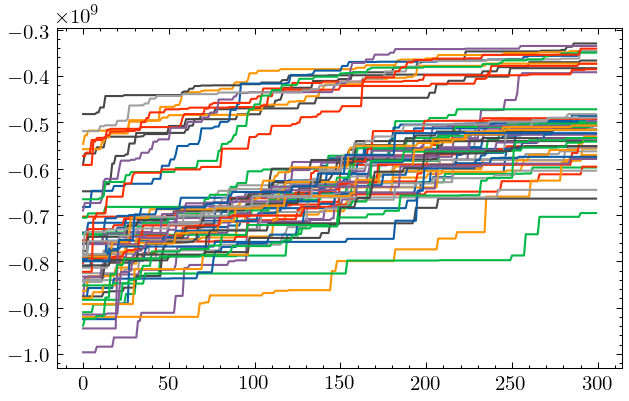

In [53]:
fig, ax = plt.subplots(figsize=(gr*h, h))
fig.patch.set_facecolor('white')

nb = 200
lnp = sampler_gp.get_log_prob(discard=nb)

ii = np.where(np.min(lnp, axis=0) > -1e9)[0]

ax.plot(lnp[:, ii]);

In [54]:
chain = sampler_gp.get_chain(discard=nb)[:, ii, :]
_, _, nd = chain.shape
flat_chain = chain.reshape(-1, nd)

In [55]:
from corner import corner

In [56]:
nrpar = 16

In [60]:
model.azr.config.labels

['$C_{1,1}^{(-0.5)}$',
 '$\\Gamma_{2,1}^{(-0.5)}$',
 '$\\Gamma_{1,1}^{(+0.5)}$',
 '$\\Gamma_{1,2}^{(+0.5)}$',
 '$\\Gamma_{1,3}^{(+0.5)}$',
 '$C_{1,1}^{(-1.5)}$',
 '$\\Gamma_{2,1}^{(-1.5)}$',
 '$\\Gamma_{1,1}^{(+1.5)}$',
 '$\\Gamma_{1,2}^{(+1.5)}$',
 '$\\Gamma_{1,3}^{(+1.5)}$',
 '$\\Gamma_{1,1}^{(-2.5)}$',
 '$\\Gamma_{1,1}^{(+2.5)}$',
 '$\\Gamma_{1,2}^{(+2.5)}$',
 '$E_{1,1}^{(-3.5)}$',
 '$\\Gamma_{1,1}^{(-3.5)}$',
 '$\\Gamma_{1,2}^{(-3.5)}$']

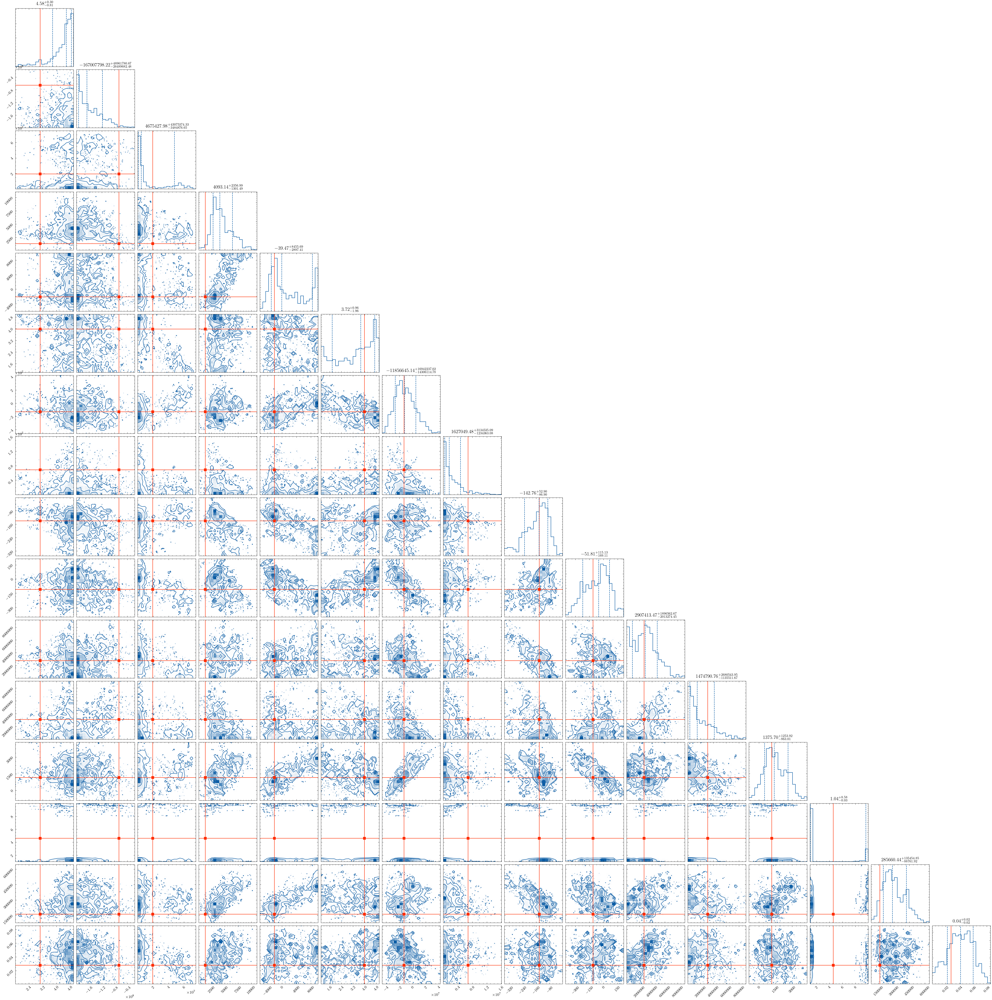

In [57]:
fig = corner(flat_chain[:, :nrpar], show_titles=True, quantiles=[0.16, 0.5, 0.84], color='C0', 
             truths=theta_true[:nrpar], truth_color='C3')
fig.patch.set_facecolor('white')

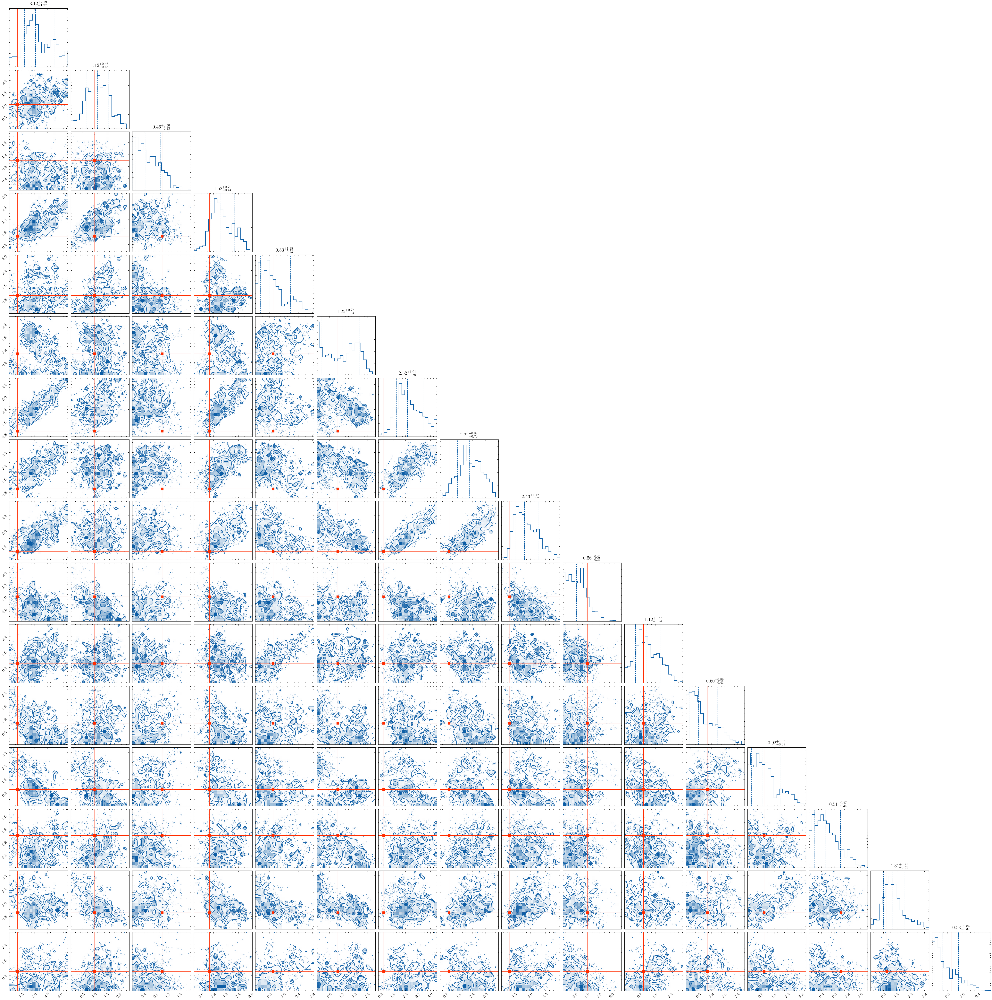

In [58]:
fig = corner(flat_chain[:, nrpar:], show_titles=True, quantiles=[0.16, 0.5, 0.84], color='C0', 
             truths=theta_true[nrpar:], truth_color='C3')
fig.patch.set_facecolor('white')

IndexError: index 16 is out of bounds for axis 1 with size 16

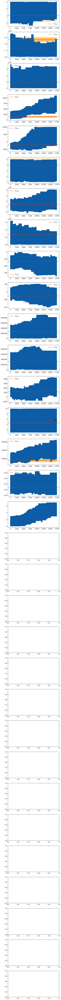

In [59]:
fig, ax = plt.subplots(nd, figsize=(gr*h, nd*h))
fig.patch.set_facecolor('white')

for i in range(nd):
    ax[i].plot(flat_chain[:, i])
#     ax[i].plot(w[:, i], label='Train')
    low_68, high_68 = np.quantile(w[:, i], [0.16, 0.84])
    low_95, high_95 = np.quantile(w[:, i], [0.05, 0.95])
    ax[i].fill_between(np.arange(flat_chain[:, i].size), low_68, high_68, color='C2', alpha=0.5)
    ax[i].fill_between(np.arange(flat_chain[:, i].size), low_95, high_95, color='C2', alpha=0.25)
#     ax[i].set_ylabel(parameter_labels[i])
    ax[i].axhline(theta_true[i], color='C3', label='True')
    ax[i].legend()

# plt.savefig(f'figures/chains_{rel_unc:.2f}.pdf')

In [44]:
lnp_r = sampler_r.get_log_prob(discard=20, flat=True)
ii = np.argsort(lnp_r)
theta_best = flat_chain_r[ii][:1000]

In [45]:
pbest = emu.predict(theta=theta_best)

In [46]:
ybest = np.array([r_func(theta)[0] for theta in theta_best]).T

In [47]:
ybest.shape

(10, 1000)

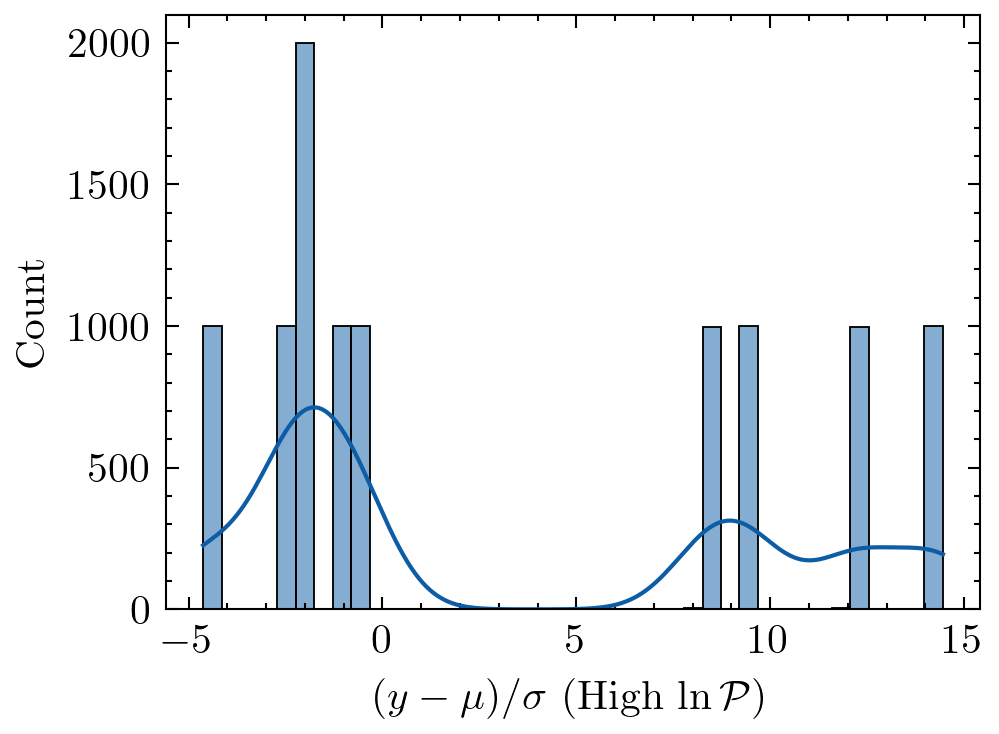

In [49]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')

sns.histplot(residuals(ybest, pbest.mean(), np.sqrt(pbest.var())).flatten(), bins=40, kde=True, ax=ax)

# ax.set_xlim([-7.2, 7.2])
ax.set_xlabel(r'$(y-\mu)/\sigma$ (High $\ln\mathcal{P}$)');

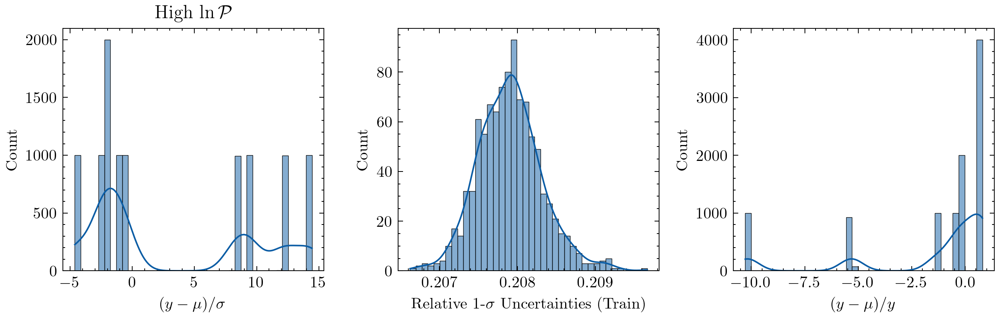

In [50]:
fig, ax = plt.subplots(ncols=3, figsize=(3*h, h), dpi=300)
fig.patch.set_facecolor('white')

sns.histplot(residuals(ybest, pbest.mean(), np.sqrt(pbest.var())).flatten(), bins=40, ax=ax[0], kde=True)
ax[0].set_xlabel(r'$(y-\mu)/\sigma$')
ax[0].set_title(r'High $\ln\mathcal{P}$')

sns.histplot(relative_uncertainties(pbest).flatten(), bins=40, ax=ax[1], kde=True) 
ax[1].set_xlabel(r'Relative 1-$\sigma$ Uncertainties (Train)')

sns.histplot(((ybest - pbest.mean()) / ybest).flatten(), bins=40, ax=ax[2], kde=True) 
ax[2].set_xlabel(r'$(y-\mu)/y$')

plt.tight_layout();